# ResNet gender prediction

In [1]:
import pandas as pd
import torch

In [2]:
# Load the data
df = pd.read_csv('./faces/fold_0_data.txt', sep="\t")

In [3]:
print(df.shape)
print(df.columns)
df.head()

(4484, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [4]:
# Load the other dataframes
df1 = pd.read_csv('./faces/fold_1_data.txt', sep="\t")
df2 = pd.read_csv('./faces/fold_2_data.txt', sep="\t")
df3 = pd.read_csv('./faces/fold_3_data.txt', sep="\t")
df4 = pd.read_csv('./faces/fold_4_data.txt', sep="\t")

# Concatenate all the dataframes
df = pd.concat([df, df1, df2, df3, df4]).reset_index(drop=True)

In [5]:
print(df.shape)
print(df.columns)
df.head()

(19370, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [6]:
# Create a new column with the path to the images
df['path'] = df['user_id'] + '/' + "coarse_tilt_aligned_face." + df['face_id'].astype(str) + "." + df['original_image']
df['path'].head()

0    30601258@N03/coarse_tilt_aligned_face.1.103996...
1    30601258@N03/coarse_tilt_aligned_face.2.104248...
2    30601258@N03/coarse_tilt_aligned_face.1.104379...
3    30601258@N03/coarse_tilt_aligned_face.3.104379...
4    30601258@N03/coarse_tilt_aligned_face.2.118166...
Name: path, dtype: object

In [7]:
# drop duplicate images
df = df.drop_duplicates(subset=['path'], keep='first').reset_index(drop=True)

In [8]:
df.shape

(19370, 13)

In [9]:
df['gender'].value_counts()

gender
f    9372
m    8120
u    1099
Name: count, dtype: int64

In [10]:
# drop the rows with u or nan for gender
df = df[(df['gender'] != 'u') & (df['gender'].notnull())]
df['gender'].value_counts()

gender
f    9372
m    8120
Name: count, dtype: int64

In [11]:
# encode gender column as male
df['male'] = df['gender'].apply(lambda x: 1 if x == 'm' else 0)
df['male'].value_counts()

male
0    9372
1    8120
Name: count, dtype: int64

In [ ]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
from PIL import Image


dim = 224 # image size


# Define the dataset class
class ImageDataset(Dataset):
  def __init__(self, annotations_df, img_dir, dim=dim, transform=None, target_transform=None):
    self.annotations_df = annotations_df
    self.img_dir = img_dir
    self.dim = dim
    self.transform = transform
    self.target_transform = target_transform

  def __len__(self):
    return len(self.annotations_df)

  def __getitem__(self, idx):
    img_path = os.path.join(self.img_dir, self.annotations_df.loc[idx, 'path'])
    # read the image and resize
    image = Image.open(img_path).convert("RGB")
    image = image.resize((self.dim, self.dim))
    # convert to tensor
    image = ToTensor()(image)
    label = self.annotations_df.loc[idx, 'male']
    label = torch.tensor(label)
    if self.transform: # apply any transformations (for data augmentation on train set)
        image = self.transform(image, self.dim)
    if self.target_transform:
        label = self.target_transform(label)
    return image, label

In [ ]:
from torchvision import transforms

def transform_image(image, dim):
  # data augmentation
  # random horizontal flip, rotation, crop and color jitter
  transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(dim, scale=(0.8, 1.0), ratio=(1.0,1.0)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
  ])
  return transform(image)

## 10000 datapoints: 8000 Train, 1000 Val, 1000 Test

In [14]:
# sample 10000 images, with an equal number of each gender
df_male = df[df['gender'] == 'm'].sample(n=5000, random_state=23)
df_female = df[df['gender'] == 'f'].sample(n=5000, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    5000
f    5000
Name: count, dtype: int64


In [15]:
# Get train, validation and test sets (80-10-10)
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df_sampled, test_size=0.2, random_state=23)
val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [16]:
len(train_dataset), len(val_dataset), len(test_dataset)

(8000, 1000, 1000)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


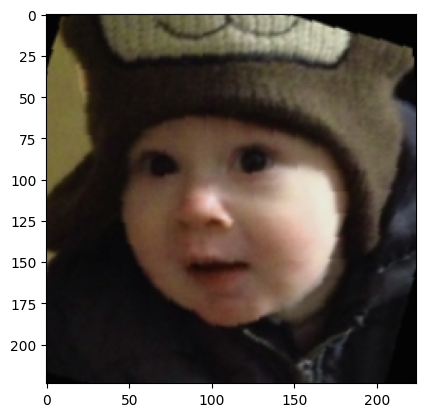

In [17]:
# show an image
image, label = train_dataset[1]
plt.imshow(image.permute(1, 2, 0))
plt.show()

In [18]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
# Define the labels and their mapping
labels = ["female", "male"]
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

### Train from scratch

In [ ]:
from torchvision.models import resnet50

# Load the model with random weights and set num_classes to 2
resnet50 = resnet50(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnet50.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [22]:
# Check the number of parameters
total_params = sum([param.numel() for param in resnet50.parameters()])
print(f'{total_params:,} total parameters.')

23,512,130 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(resnet50.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  resnet50.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = resnet50(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  resnet50.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = resnet50(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(resnet50.state_dict(), 'resnet50.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.7095, Training Accuracy: 0.5434
Validation Loss: 0.8257, Validation Accuracy: 0.5470
===== Epoch 2 =====
Training Loss: 0.6629, Training Accuracy: 0.6029
Validation Loss: 0.6674, Validation Accuracy: 0.6160
===== Epoch 3 =====
Training Loss: 0.6107, Training Accuracy: 0.6635
Validation Loss: 0.5920, Validation Accuracy: 0.6900
===== Epoch 4 =====
Training Loss: 0.5729, Training Accuracy: 0.7026
Validation Loss: 0.5720, Validation Accuracy: 0.7020
===== Epoch 5 =====
Training Loss: 0.5494, Training Accuracy: 0.7150
Validation Loss: 0.5436, Validation Accuracy: 0.7230
===== Epoch 6 =====
Training Loss: 0.5246, Training Accuracy: 0.7380
Validation Loss: 0.5501, Validation Accuracy: 0.7280
===== Epoch 7 =====
Training Loss: 0.4940, Training Accuracy: 0.7602
Validation Loss: 0.4866, Validation Accuracy: 0.7640
===== Epoch 8 =====
Training Loss: 0.4717, Training Accuracy: 0.7696
Validation Loss: 0.4689, Validation Accuracy: 0.7590
===== Epoch 9 =====
Trai

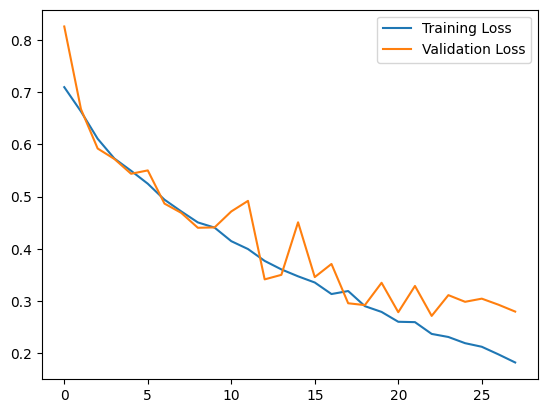

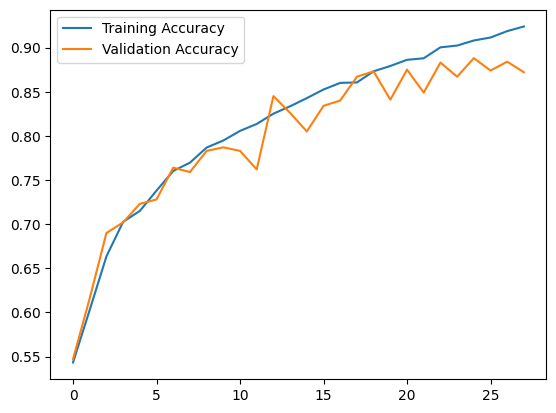

In [25]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.9020

F1-Score: 0.9020

Precision: 0.9020

Recall: 0.9020


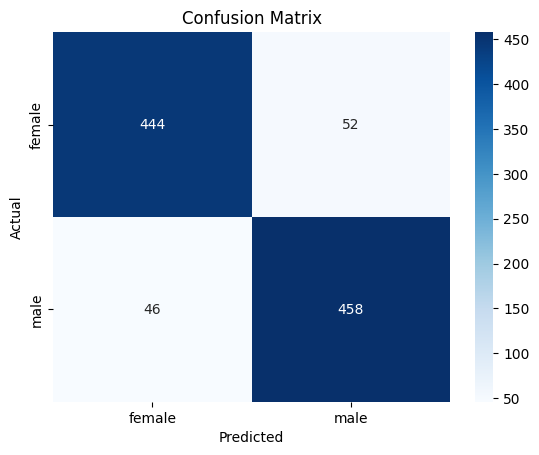

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
resnet50.load_state_dict(torch.load('resnet50.pth'))
resnet50.to(device)

resnet50.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = resnet50(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

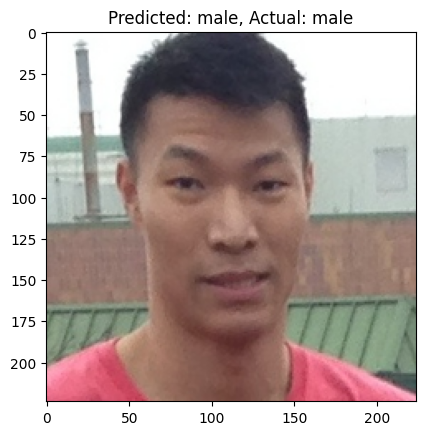

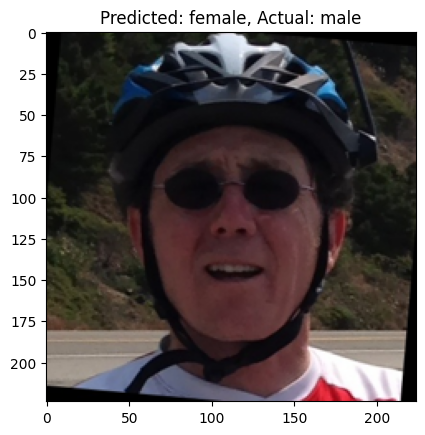

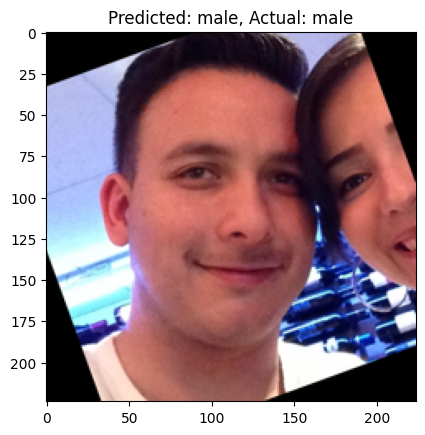

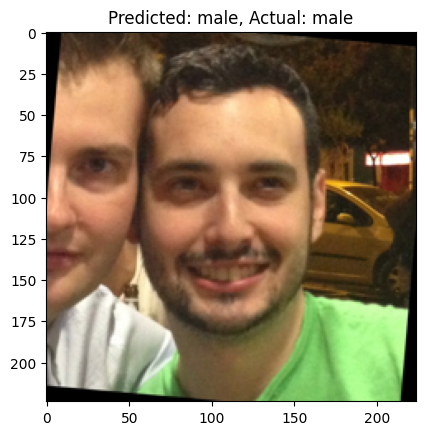

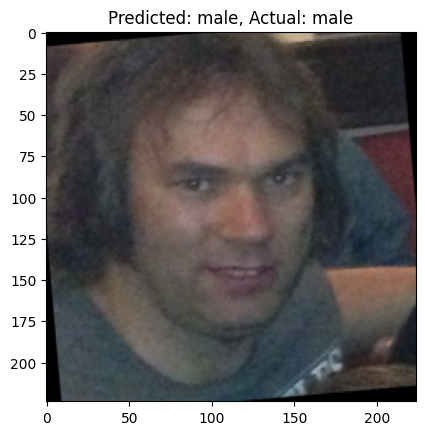

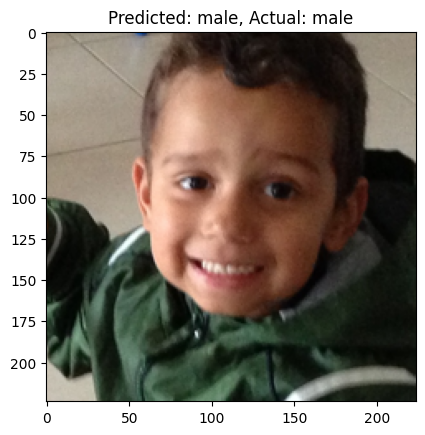

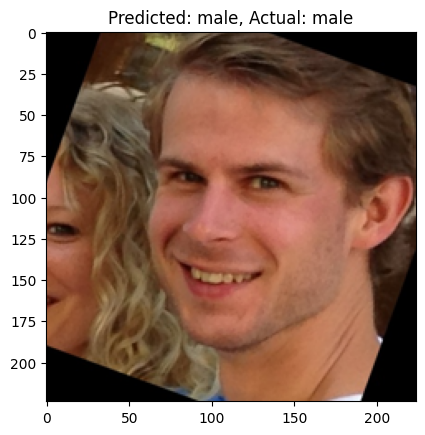

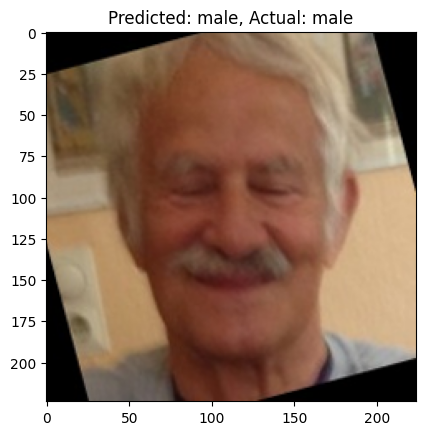

In [28]:
# Show some predictions
resnet50.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = resnet50(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

# Load pretrained model
resnet50 = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
# Change the final classification layer to output 2 classes
resnet50.fc = torch.nn.Linear(resnet50.fc.in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnet50.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 193MB/s] 


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [30]:
# Check the number of parameters
total_params = sum([param.numel() for param in resnet50.parameters()])
print(f'{total_params:,} total parameters.')

23,512,130 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(resnet50.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  resnet50.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = resnet50(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  resnet50.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = resnet50(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(resnet50.state_dict(), 'resnet50_finetune.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Training Loss: 0.2897, Training Accuracy: 0.8751
Validation Loss: 0.1658, Validation Accuracy: 0.9370
===== Epoch 2 =====
Training Loss: 0.1592, Training Accuracy: 0.9371
Validation Loss: 0.1258, Validation Accuracy: 0.9560
===== Epoch 3 =====
Training Loss: 0.1149, Training Accuracy: 0.9583
Validation Loss: 0.1315, Validation Accuracy: 0.9510
===== Epoch 4 =====
Training Loss: 0.0864, Training Accuracy: 0.9689
Validation Loss: 0.1921, Validation Accuracy: 0.9360
===== Epoch 5 =====
Training Loss: 0.0851, Training Accuracy: 0.9685
Validation Loss: 0.1209, Validation Accuracy: 0.9550
===== Epoch 6 =====
Training Loss: 0.0598, Training Accuracy: 0.9784
Validation Loss: 0.1307, Validation Accuracy: 0.9540
===== Epoch 7 =====
Training Loss: 0.0582, Training Accuracy: 0.9776
Validation Loss: 0.1128, Validation Accuracy: 0.9600
===== Epoch 8 =====
Training Loss: 0.0485, Training Accuracy: 0.9821
Validation Loss: 0.1013, Validation Accuracy: 0.9620
===== Epoch 9 =====
Training Loss: 0.0508, T

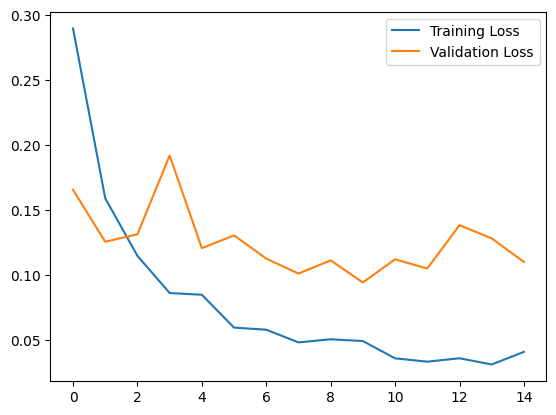

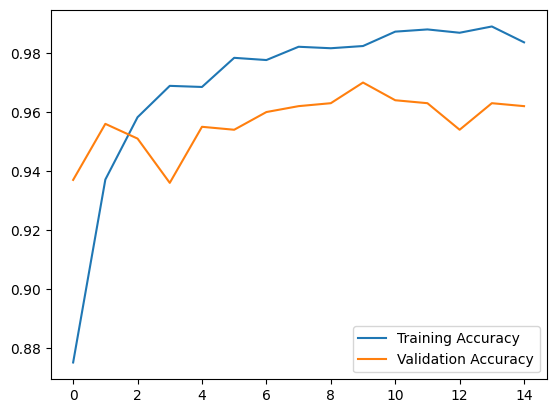

In [33]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.9680

F1-Score: 0.9680

Precision: 0.9680

Recall: 0.9680


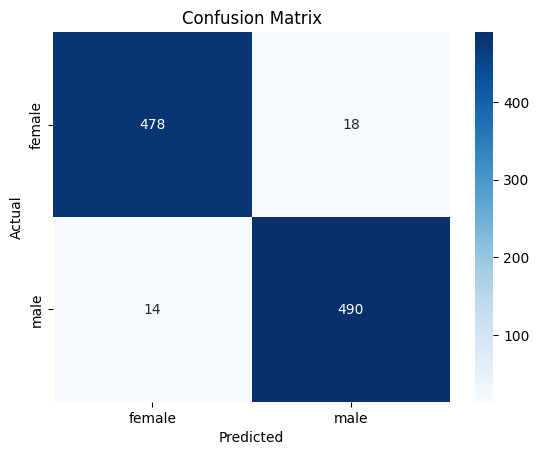

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
resnet50.load_state_dict(torch.load('resnet50_finetune.pth'))
resnet50.to(device)

resnet50.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = resnet50(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

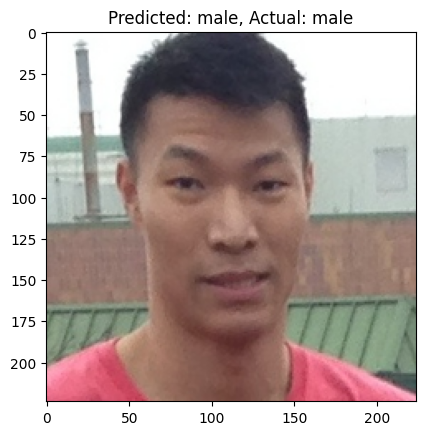

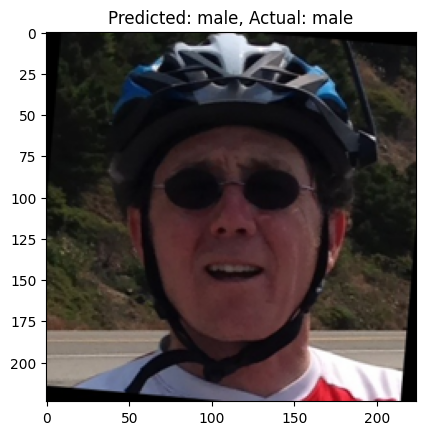

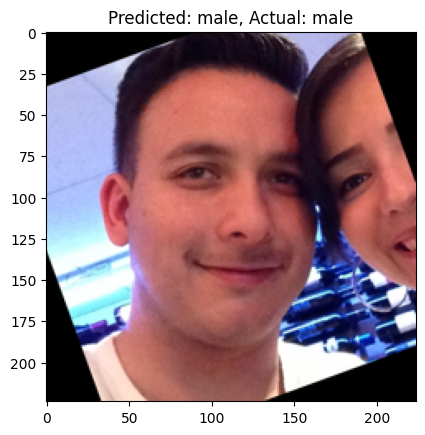

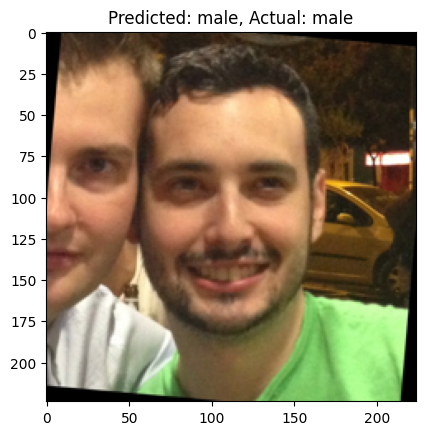

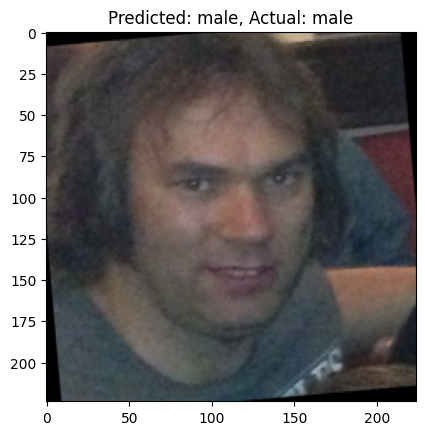

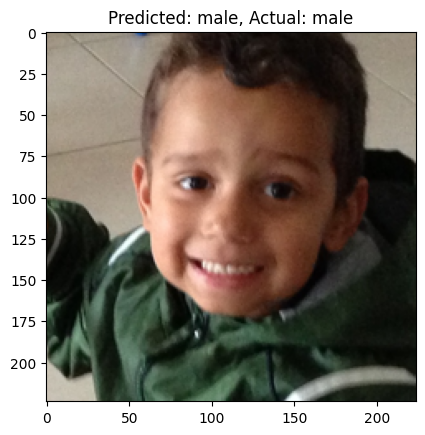

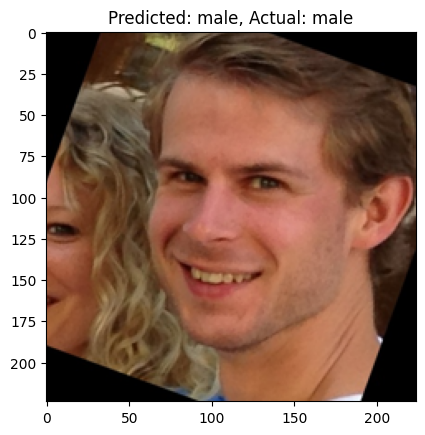

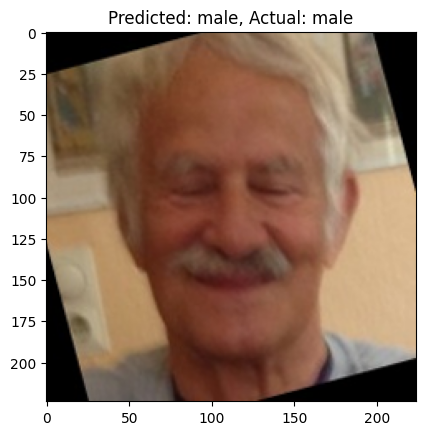

In [35]:
# Show some predictions
resnet50.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = resnet50(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## Less Training Data (4000 Train, 500 Val, Same 1000 Test data)

In [36]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 4500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=2250, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=2250, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    2250
f    2250
Name: count, dtype: int64


In [37]:
# Get train and validation sets (4000-500)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [38]:
len(train_dataset), len(val_dataset), len(test_dataset)

(4000, 500, 1000)

In [39]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Train from scratch

In [ ]:
from torchvision.models import resnet50

# Load the model with random weights and set num_classes to 2
resnet50 = resnet50(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnet50.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [41]:
# Check the number of parameters
total_params = sum([param.numel() for param in resnet50.parameters()])
print(f'{total_params:,} total parameters.')

23,512,130 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(resnet50.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  resnet50.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = resnet50(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  resnet50.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = resnet50(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(resnet50.state_dict(), 'resnet50_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.6931, Training Accuracy: 0.5530
Validation Loss: 0.6838, Validation Accuracy: 0.5540
===== Epoch 2 =====
Training Loss: 0.6731, Training Accuracy: 0.5877
Validation Loss: 0.7873, Validation Accuracy: 0.5740
===== Epoch 3 =====
Training Loss: 0.6539, Training Accuracy: 0.6198
Validation Loss: 0.7735, Validation Accuracy: 0.5700
===== Epoch 4 =====
Training Loss: 0.6271, Training Accuracy: 0.6508
Validation Loss: 0.7154, Validation Accuracy: 0.6580
===== Epoch 5 =====
Training Loss: 0.6120, Training Accuracy: 0.6615
Validation Loss: 0.6086, Validation Accuracy: 0.6600
===== Epoch 6 =====
Training Loss: 0.5925, Training Accuracy: 0.6787
Validation Loss: 0.6123, Validation Accuracy: 0.6840
===== Epoch 7 =====
Training Loss: 0.5691, Training Accuracy: 0.7027
Validation Loss: 0.6390, Validation Accuracy: 0.6680
===== Epoch 8 =====
Training Loss: 0.5620, Training Accuracy: 0.6950
Validation Loss: 0.5669, Validation Accuracy: 0.6900
===== Epoch 9 =====
Trai

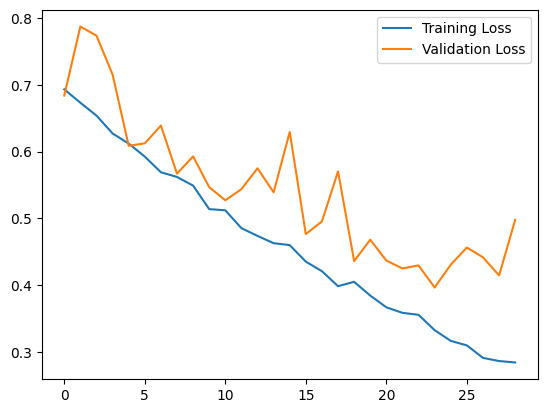

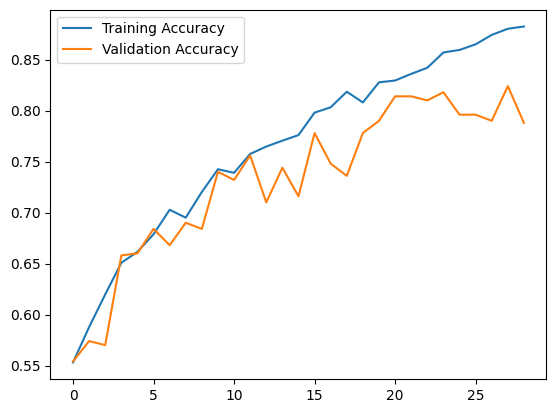

In [45]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.8230

F1-Score: 0.8225

Precision: 0.8260

Recall: 0.8230


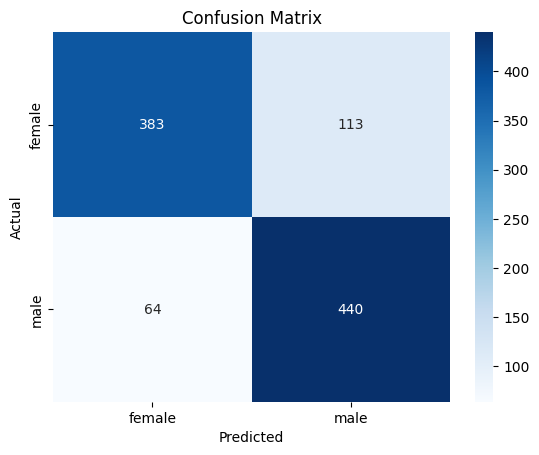

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
resnet50.load_state_dict(torch.load('resnet50_s_data.pth'))
resnet50.to(device)

resnet50.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = resnet50(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

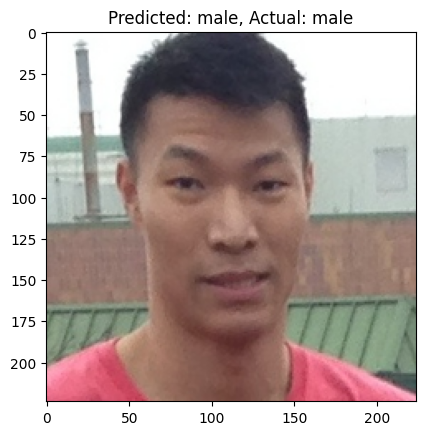

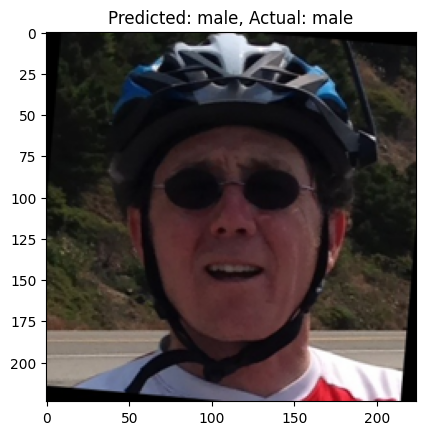

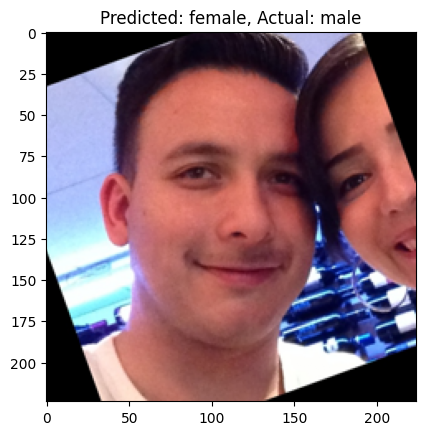

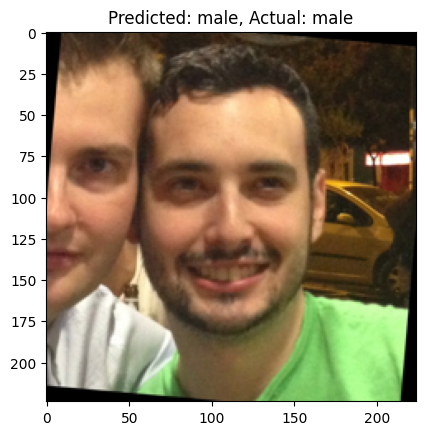

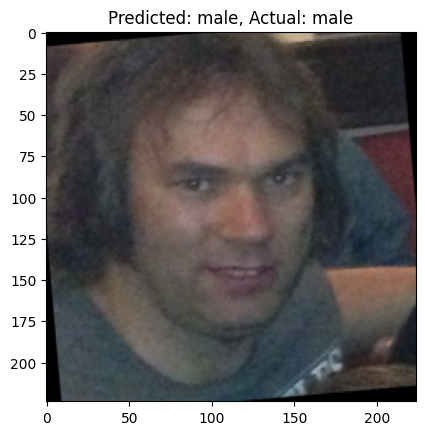

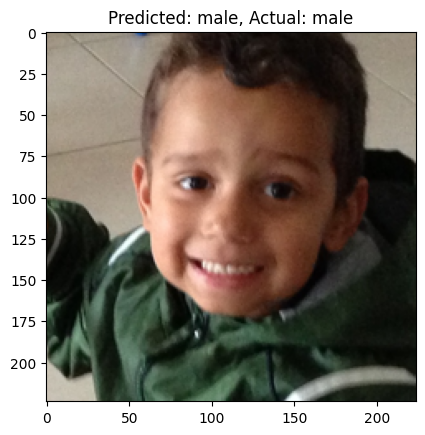

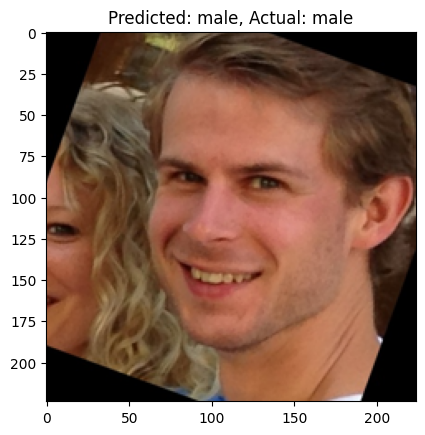

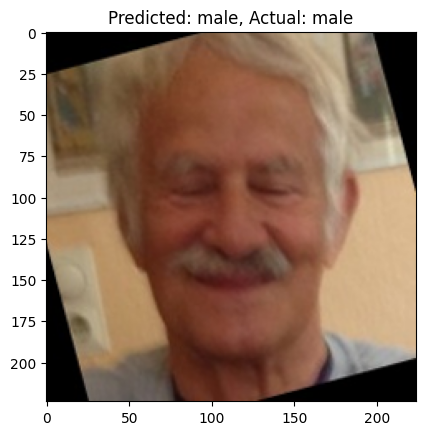

In [47]:
# Show some predictions
resnet50.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = resnet50(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

# Load pretrained model
resnet50 = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
# Change the final classification layer to output 2 classes
resnet50.fc = torch.nn.Linear(resnet50.fc.in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnet50.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [49]:
# Check the number of parameters
total_params = sum([param.numel() for param in resnet50.parameters()])
print(f'{total_params:,} total parameters.')

23,512,130 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(resnet50.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  resnet50.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = resnet50(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  resnet50.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = resnet50(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(resnet50.state_dict(), 'resnet50_finetune_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Training Loss: 0.3335, Training Accuracy: 0.8488
Validation Loss: 0.2363, Validation Accuracy: 0.8960
===== Epoch 2 =====
Training Loss: 0.1971, Training Accuracy: 0.9220
Validation Loss: 0.2007, Validation Accuracy: 0.9160
===== Epoch 3 =====
Training Loss: 0.1058, Training Accuracy: 0.9610
Validation Loss: 0.2406, Validation Accuracy: 0.9200
===== Epoch 4 =====
Training Loss: 0.1258, Training Accuracy: 0.9495
Validation Loss: 0.1911, Validation Accuracy: 0.9220
===== Epoch 5 =====
Training Loss: 0.0676, Training Accuracy: 0.9752
Validation Loss: 0.2228, Validation Accuracy: 0.9300
===== Epoch 6 =====
Training Loss: 0.0895, Training Accuracy: 0.9617
Validation Loss: 0.2331, Validation Accuracy: 0.9240
===== Epoch 7 =====
Training Loss: 0.0696, Training Accuracy: 0.9722
Validation Loss: 0.2572, Validation Accuracy: 0.9140
===== Epoch 8 =====
Training Loss: 0.0661, Training Accuracy: 0.9760
Validation Loss: 0.2348, Validation Accuracy: 0.9280
===== Epoch 9 =====
Training Loss: 0.0361, T

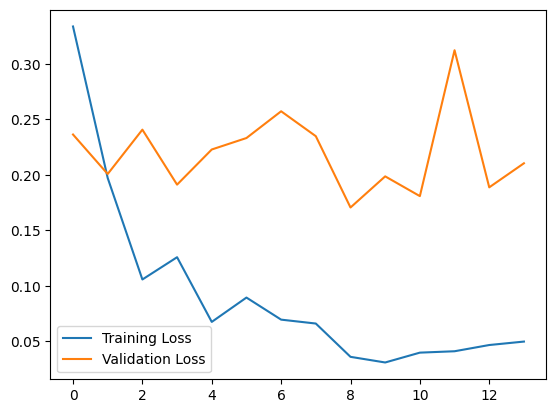

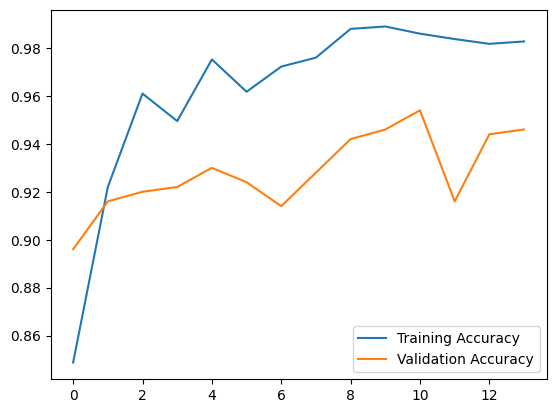

In [52]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.9530

F1-Score: 0.9530

Precision: 0.9530

Recall: 0.9530


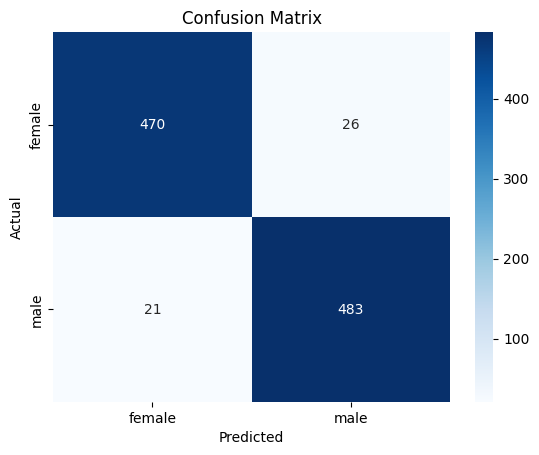

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
resnet50.load_state_dict(torch.load('resnet50_finetune_s_data.pth'))
resnet50.to(device)

resnet50.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = resnet50(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

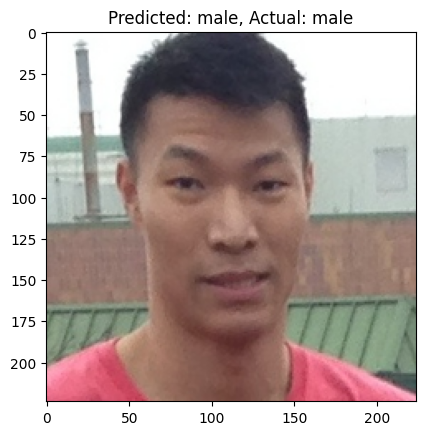

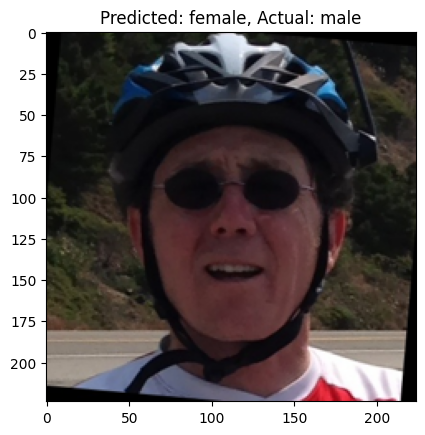

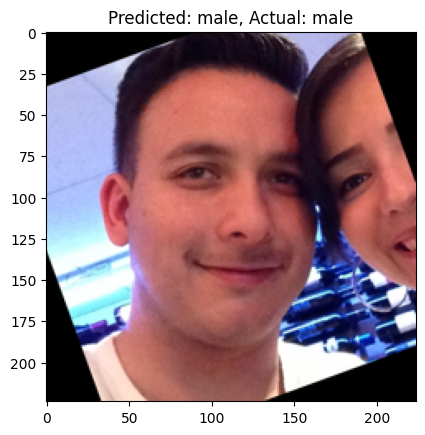

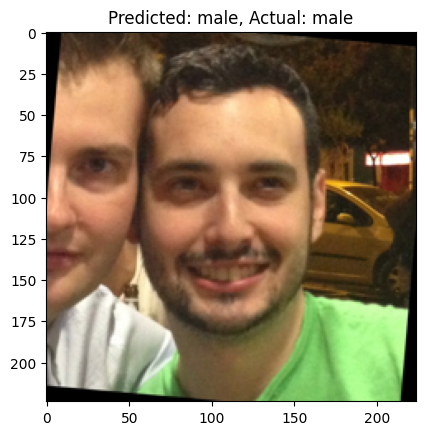

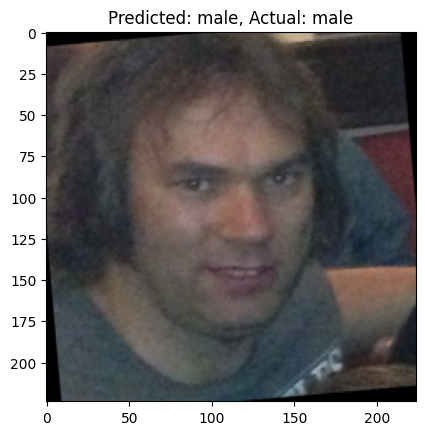

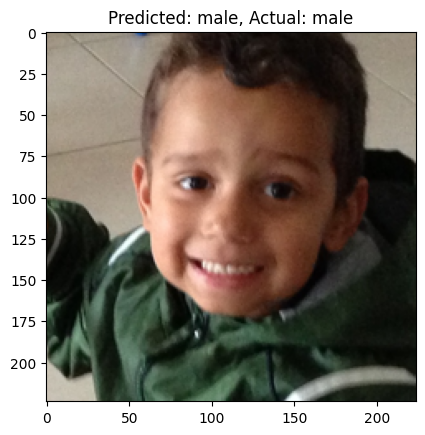

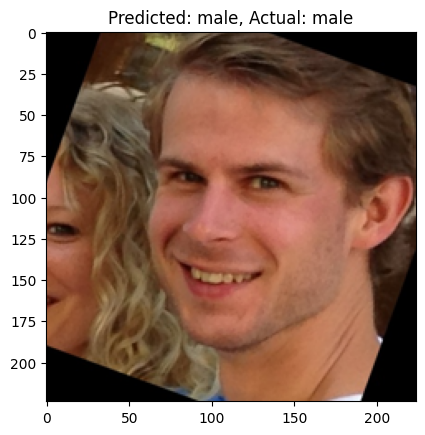

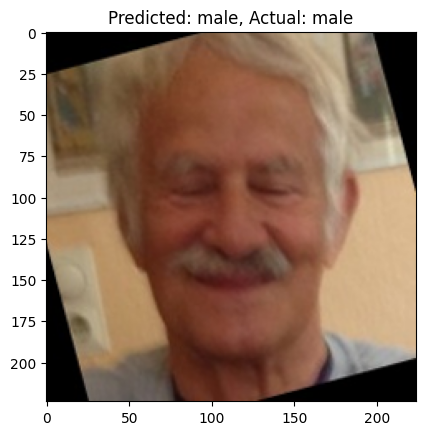

In [54]:
# Show some predictions
resnet50.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = resnet50(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## More Training Data (12000 Train, 1500 Val, Same 1000 Test data)

In [55]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 13500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=6750, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=6750, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    6750
f    6750
Name: count, dtype: int64


In [56]:
# Get train and validation sets (12000-1500)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=1500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [57]:
len(train_dataset), len(val_dataset), len(test_dataset)

(12000, 1500, 1000)

In [58]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Train from scratch

In [ ]:
from torchvision.models import resnet50

# Load the model with random weights and set num_classes to 2
resnet50 = resnet50(num_classes=2, weights=None)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnet50.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [60]:
# Check the number of parameters
total_params = sum([param.numel() for param in resnet50.parameters()])
print(f'{total_params:,} total parameters.')

23,512,130 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(resnet50.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  resnet50.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = resnet50(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  resnet50.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = resnet50(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(resnet50.state_dict(), 'resnet50_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Training Loss: 0.6925, Training Accuracy: 0.5647
Validation Loss: 0.7419, Validation Accuracy: 0.5960
===== Epoch 2 =====
Training Loss: 0.6341, Training Accuracy: 0.6409
Validation Loss: 0.6285, Validation Accuracy: 0.6447
===== Epoch 3 =====
Training Loss: 0.5831, Training Accuracy: 0.6882
Validation Loss: 0.6393, Validation Accuracy: 0.6460
===== Epoch 4 =====
Training Loss: 0.5353, Training Accuracy: 0.7272
Validation Loss: 0.5345, Validation Accuracy: 0.7233
===== Epoch 5 =====
Training Loss: 0.5123, Training Accuracy: 0.7486
Validation Loss: 0.5304, Validation Accuracy: 0.7340
===== Epoch 6 =====
Training Loss: 0.4870, Training Accuracy: 0.7600
Validation Loss: 0.5083, Validation Accuracy: 0.7580
===== Epoch 7 =====
Training Loss: 0.4494, Training Accuracy: 0.7891
Validation Loss: 0.4316, Validation Accuracy: 0.7887
===== Epoch 8 =====
Training Loss: 0.4230, Training Accuracy: 0.8018
Validation Loss: 0.4433, Validation Accuracy: 0.7913
===== Epoch 9 =====
Training Loss: 0.4146, T

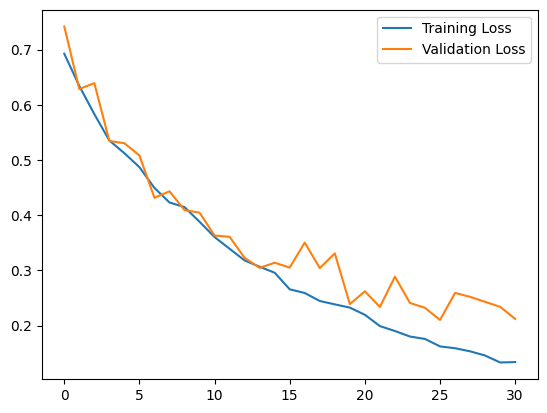

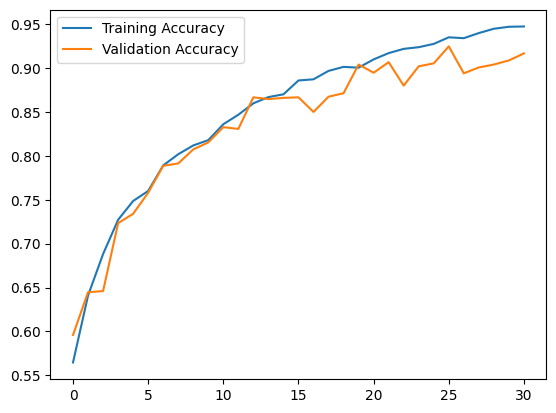

In [63]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.9130

F1-Score: 0.9130

Precision: 0.9134

Recall: 0.9130


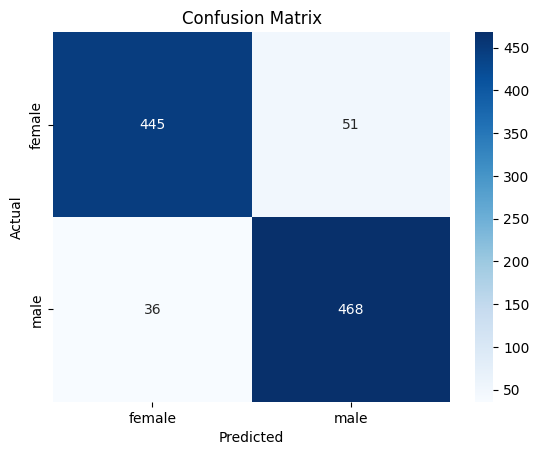

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
resnet50.load_state_dict(torch.load('resnet50_l_data.pth'))
resnet50.to(device)

resnet50.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = resnet50(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

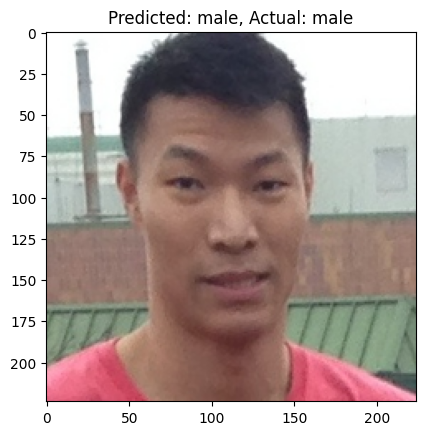

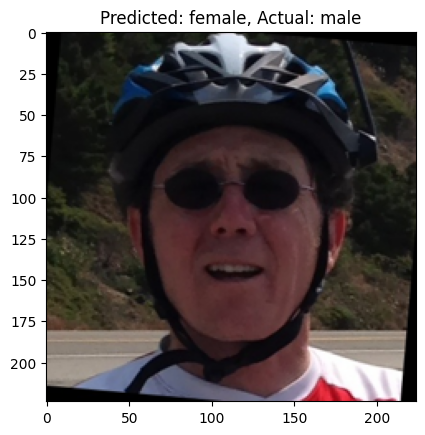

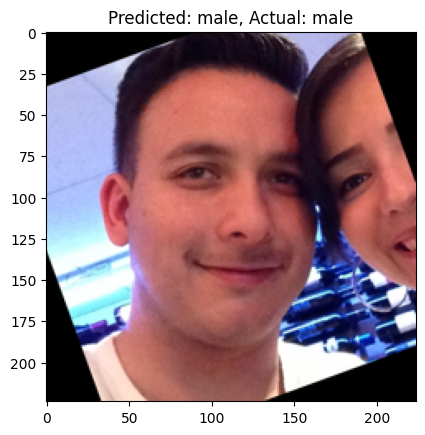

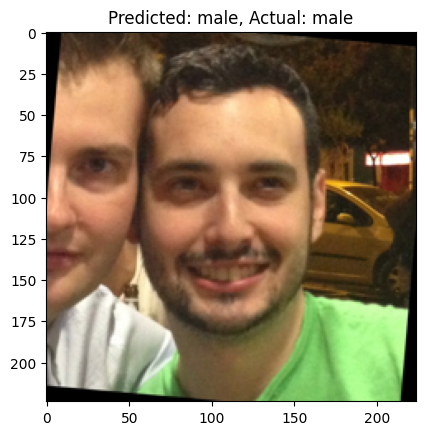

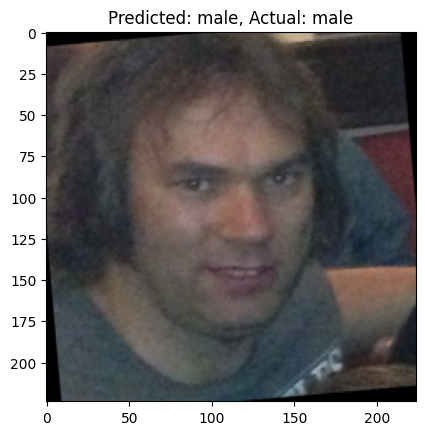

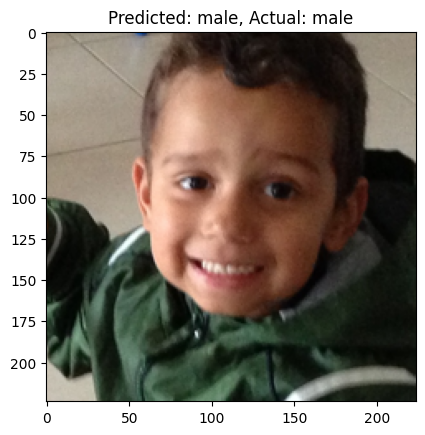

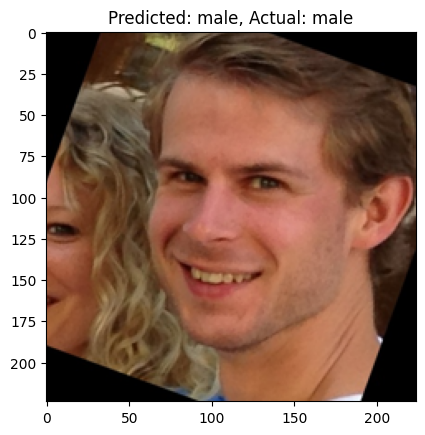

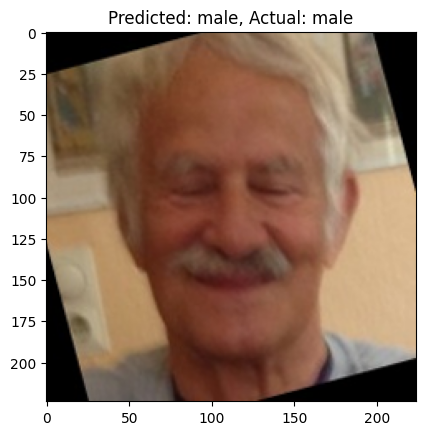

In [65]:
# Show some predictions
resnet50.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = resnet50(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

# Load pretrained model
resnet50 = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
# Change the final classification layer to output 2 classes
resnet50.fc = torch.nn.Linear(resnet50.fc.in_features, 2)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
resnet50.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [67]:
# Check the number of parameters
total_params = sum([param.numel() for param in resnet50.parameters()])
print(f'{total_params:,} total parameters.')

23,512,130 total parameters.


In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(resnet50.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  resnet50.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    outputs = resnet50(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  resnet50.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      outputs = resnet50(images)
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(resnet50.state_dict(), 'resnet50_finetune_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Training Loss: 0.2429, Training Accuracy: 0.8952
Validation Loss: 0.1220, Validation Accuracy: 0.9527
===== Epoch 2 =====
Training Loss: 0.1337, Training Accuracy: 0.9487
Validation Loss: 0.1106, Validation Accuracy: 0.9613
===== Epoch 3 =====
Training Loss: 0.1045, Training Accuracy: 0.9606
Validation Loss: 0.0879, Validation Accuracy: 0.9647
===== Epoch 4 =====
Training Loss: 0.0860, Training Accuracy: 0.9695
Validation Loss: 0.0785, Validation Accuracy: 0.9673
===== Epoch 5 =====
Training Loss: 0.0658, Training Accuracy: 0.9769
Validation Loss: 0.0848, Validation Accuracy: 0.9680
===== Epoch 6 =====
Training Loss: 0.0682, Training Accuracy: 0.9741
Validation Loss: 0.1042, Validation Accuracy: 0.9653
===== Epoch 7 =====
Training Loss: 0.0554, Training Accuracy: 0.9795
Validation Loss: 0.0829, Validation Accuracy: 0.9707
===== Epoch 8 =====
Training Loss: 0.0475, Training Accuracy: 0.9830
Validation Loss: 0.1076, Validation Accuracy: 0.9580
===== Epoch 9 =====
Training Loss: 0.0439, T

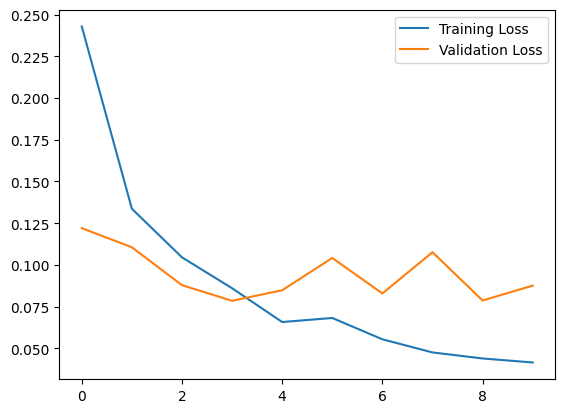

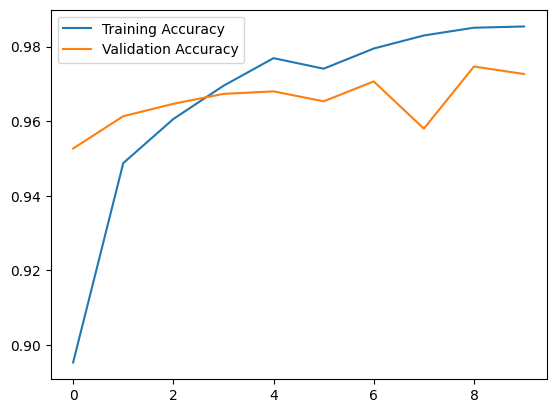

In [70]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.9730

F1-Score: 0.9730

Precision: 0.9730

Recall: 0.9730


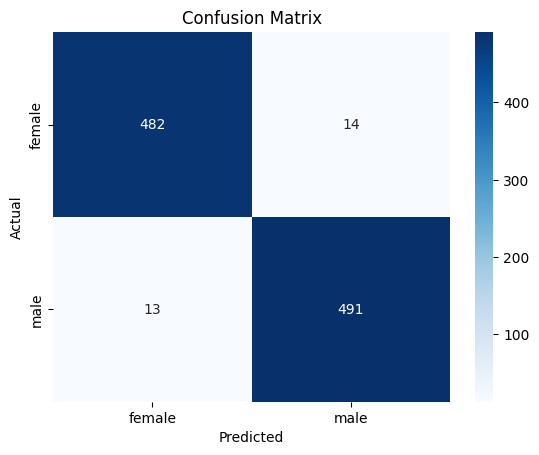

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
resnet50.load_state_dict(torch.load('resnet50_finetune_l_data.pth'))
resnet50.to(device)

resnet50.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = resnet50(images)
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

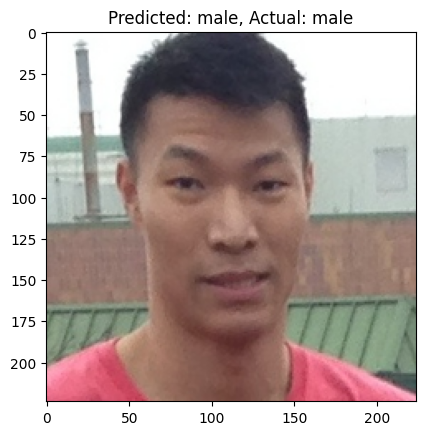

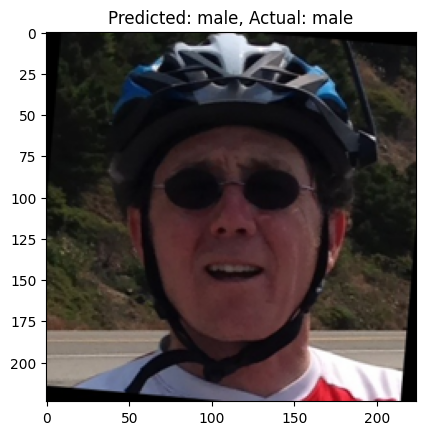

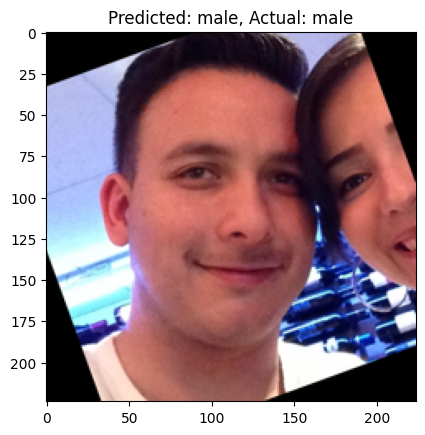

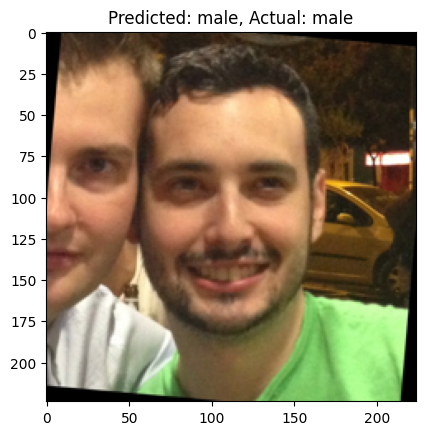

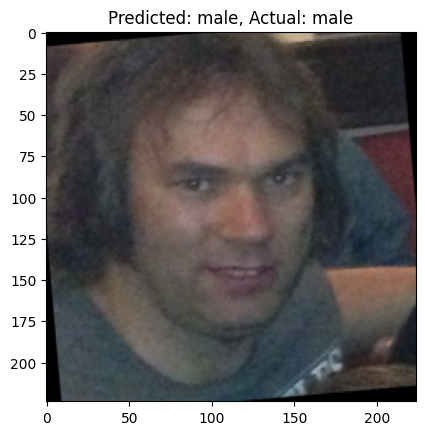

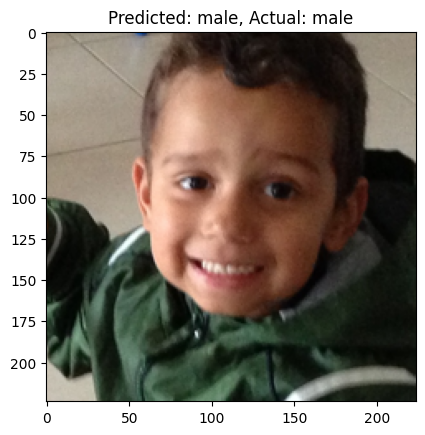

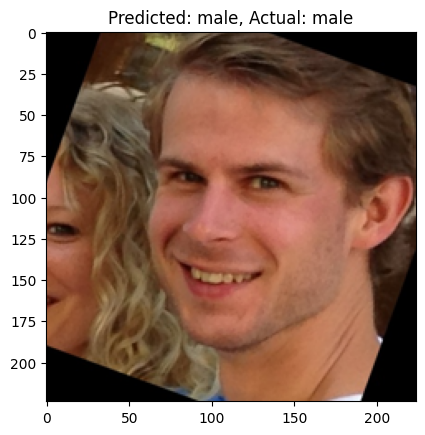

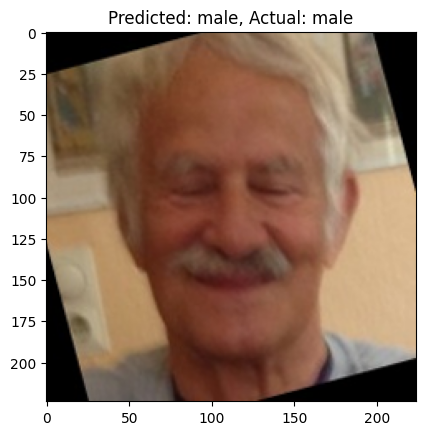

In [72]:
# Show some predictions
resnet50.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
outputs = resnet50(images)
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()